In [ ]:
import sys
import os
from pathlib import Path
import pickle
import torch
import torch.nn as nn
import numpy as np
import pprint

import matplotlib.pyplot as plt
import seaborn as sns

sys.path.append(os.getcwd())
sys.path.append(str(Path(os.getcwd()).parent))
from utils import *
from configuration import *
import src.pNN_FA_MIX as pNN


if not os.path.exists('./evaluation/'):
    os.makedirs('./evaluation/')

args = parser.parse_args([])
args = FormulateArgs(args)
args.dropout = 0.0
args.e_train = 0.0

In [2]:
folder_path = 'dataset'
# file_count = len(os.listdir(folder_path))
file_count = 1
file_count

1

In [3]:
normal_datasets = ['Dataset_acuteinflammation.ds', #0
                       'Dataset_balancescale.ds', #1
                       'Dataset_breastcancerwisc.ds', #2
                       'Dataset_cardiotocography3clases.ds', #3
                       'Dataset_energyy1.ds', #4
                       'Dataset_energyy2.ds', #5
                       'Dataset_iris.ds', #6
                       'Dataset_mammographic.ds', #7
                       'Dataset_pendigits.ds', #8
                       'Dataset_seeds.ds', #9
                       'Dataset_tictactoe.ds', #10
                       'Dataset_vertebralcolumn2clases.ds', #11
                       'Dataset_vertebralcolumn3clases.ds'] #12
len(normal_datasets)

13

In [4]:
# dataset = range(file_count)
dataset = [0]
project_name = ['FaultAnalysisNormal']
type_nonlinears = {'normal'}
acts = {'tanh'}
fault_ratio = [0.0, 0.025, 0.05, 0.075, 0.1]
test_fault_ratio = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3]

In [5]:
import os
import torch
import pandas as pd

num_file = 0
# Initialize variables for saving the data
trained_model = None
for act in acts:
    args.act = act
    for a, p in zip(type_nonlinears, project_name):
        args.type_nonlinear = a
        for fr in fault_ratio:
            pn=act+'_'+str(int(fr*100))+'_'+p
            args.project_name = pn
            # print(pn)
            for seed in range(10):
                args.SEED = seed
                for ds in dataset:
                    args.DATASET = ds
                    valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')

                    modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
                    model_file = f"./archive_results/filter_10092024/{pn}/models/{modelname}"
                    # model_file = f"./{pn}/models/{modelname}"
                    # model_file = f"./{pn}/models/{modelname}"
                    if not os.path.exists(model_file):
                        print(f"Model {model_file} does not exist")
                        # num_file += 1
                        continue
                    num_file += 1

In [6]:
# 10 seeds * 5 fault_ratio * 1 dataset = 50
num_file

50

In [7]:
args.act = 'tanh'
args.type_nonlinear = 'normal'
args.project_name = 'FaultAnalysisNormal'
# wieght 4
args.SEED = 3
args.DATASET = 0
fr = 0.0
pn=act+'_'+str(int(fr*100))+'_'+p

modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
model_file = f"./archive_results/filter_10092024/{pn}/models/{modelname}"
# model_file = f"./{pn}/models/{modelname}"
if not os.path.exists(model_file):
    print(f"Model {model_file} does not exist")
# print(f"Loading model from {model_file}")
fault_free_trained_model = torch.load(model_file, map_location=args.DEVICE)
SetSeed(args.SEED)

args.e_fault = 0.0
args.N_fault = 1
if args.e_fault == 0:
    args.N_fault = 1
N_Faults = args.N_fault
fault_free_trained_model.UpdateArgs(args)
fault_free_trained_model.UpdateFault(args.N_fault, args.e_fault)
fault_free_trained_model.UpdateVariation(1, 0.)

evaluator = Evaluator(args).to(args.DEVICE)

valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
train_loader, datainfo = GetDataLoader(args, 'train', path='./dataset/')
for x, y in valid_loader:
    X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
    
for x, y in test_loader:
    X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)
    
for x, y in train_loader:
    X_train, y_train = x.to(args.DEVICE), y.to(args.DEVICE)
    
result_valid = evaluator(fault_free_trained_model, X_valid, y_valid)
valid_acc, valid_std, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']

print(f"Valid Acc: {valid_acc:.4f}, Valid Std: {valid_std:.4f}")
ground_truth_prediction_val = fault_free_trained_model(X_valid)
ground_truth_prediction_test = fault_free_trained_model(X_test)
ground_truth_prediction_train = fault_free_trained_model(X_train)
# faulty_prediction = faulty_prediction[0, 0, :, :]

ground_truth_prediction_val = nn.Softmax(dim=1)(ground_truth_prediction_val[0, 0, :, :])
# faulty_prediction_val = faulty_prediction_val[0, 0, :, :]

ground_truth_prediction_test = nn.Softmax(dim=1)(ground_truth_prediction_test[0, 0, :, :])
# faulty_prediction_test = faulty_prediction_test[0, 0, :, :]

ground_truth_prediction_train = nn.Softmax(dim=1)(ground_truth_prediction_train[0, 0, :, :])
# faulty_prediction_train = faulty_prediction_train[0, 0, :, :]

etas = fault_free_trained_model.act[0].eta_fault


Valid Acc: 1.0000, Valid Std: 0.0000


In [8]:
args.act = 'tanh'
args.type_nonlinear = 'normal'
args.project_name = 'FaultAnalysisNormal'
# wieght 4
args.SEED = 3
args.DATASET = 0
fr = 0.0
pn=act+'_'+str(int(fr*100))+'_'+p

modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
model_file = f"./archive_results/filter_10092024/{pn}/models/{modelname}"
# model_file = f"./{pn}/models/{modelname}"
if not os.path.exists(model_file):
    print(f"Model {model_file} does not exist")
# print(f"Loading model from {model_file}")
trained_model = torch.load(model_file, map_location=args.DEVICE)

args.e_fault = 1
args.N_fault = 1
if args.e_fault == 0:
    args.N_fault = 1
N_Faults = args.N_fault
trained_model.UpdateArgs(args)
trained_model.UpdateFault(args.N_fault, args.e_fault)
trained_model.UpdateVariation(1, 0.)

SetSeed(args.SEED)


predictions = []
results = []
for i, eta in enumerate(etas[1:]):
    print(f'faulty model -------------')
    trained_model.act[0].eta_fault = torch.stack([etas[0], eta], dim=0)

    print(f"Fault Ratio: {trained_model.args.fault_ratio} -- Fault Count: {trained_model.e_fault}, --Number of Fault: {trained_model.N_fault}")

    evaluator = Evaluator(args).to(args.DEVICE)

    valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
    test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
    train_loader, datainfo = GetDataLoader(args, 'train', path='./dataset/')
    for x, y in valid_loader:
        X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
        
    for x, y in test_loader:
        X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)
        
    for x, y in train_loader:
        X_train, y_train = x.to(args.DEVICE), y.to(args.DEVICE)
        
    result_valid = evaluator(trained_model, X_valid, y_valid)
    valid_acc, valid_std, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']
    results.append(valid_acc)
    print(f"Valid Acc: {valid_acc:.4f}, Valid Std: {valid_std:.4f}")
    faulty_prediction_val = trained_model(X_valid)
    faulty_prediction_test = trained_model(X_test)
    faulty_prediction_train = trained_model(X_train)
    # faulty_prediction = faulty_prediction[0, 0, :, :]
    
    faulty_prediction_val = nn.Softmax(dim=1)(faulty_prediction_val[0, 0, :, :])
    # faulty_prediction_val = faulty_prediction_val[0, 0, :, :]
    
    faulty_prediction_test = nn.Softmax(dim=1)(faulty_prediction_test[0, 0, :, :])
    # faulty_prediction_test = faulty_prediction_test[0, 0, :, :]
    
    faulty_prediction_train = nn.Softmax(dim=1)(faulty_prediction_train[0, 0, :, :])
    # faulty_prediction_train = faulty_prediction_train[0, 0, :, :]
    
    one_fault_pre = []

    # print(ground_truth, faulty_prediction, 1000*torch.abs(ground_truth - faulty_prediction))
    one_fault_pre.append(abs(ground_truth_prediction_val - faulty_prediction_val).cpu().detach())
    one_fault_pre.append(abs(ground_truth_prediction_test - faulty_prediction_test).cpu().detach())
    one_fault_pre.append(abs(ground_truth_prediction_train - faulty_prediction_train).cpu().detach())
    predictions.append(torch.cat(one_fault_pre, dim=0))
    print('---------------------------------------------------------------')

faulty model -------------
Fault Ratio: 0.0 -- Fault Count: 1, --Number of Fault: 1
faulty layers:  [1]
which type of faults in this layer are faulty (0:weight, 1:act, 2:neg) : [1]
which weights are faulty:  tensor([], dtype=torch.int64)
which activation functions are faulty:  tensor([1])
which negative weights are faulty:  tensor([], dtype=torch.int64)
Valid Acc: 0.6087, Valid Std: 0.0000
faulty layers:  [1]
which type of faults in this layer are faulty (0:weight, 1:act, 2:neg) : [1]
which weights are faulty:  tensor([], dtype=torch.int64)
which activation functions are faulty:  tensor([1])
which negative weights are faulty:  tensor([], dtype=torch.int64)
faulty layers:  [1]
which type of faults in this layer are faulty (0:weight, 1:act, 2:neg) : [1]
which weights are faulty:  tensor([], dtype=torch.int64)
which activation functions are faulty:  tensor([1])
which negative weights are faulty:  tensor([], dtype=torch.int64)
faulty layers:  [1]
which type of faults in this layer are faul

# second neuron 

In [9]:
# second neuron in second layer is faulty
results_val_acc =  [0.6086956521739131,
  0.6086956521739131,
  1.0,
  0.391304347826087,
  0.391304347826087,
  0.6086956521739131,
  0.391304347826087,
  0.6086956521739131,
  0.391304347826087,
  0.391304347826087,
  0.6086956521739131,
  0.6086956521739131]


In [10]:
# second neuron in first layer is faulty
results_val_acc =  [0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.782608695652174,
  0.6086956521739131]

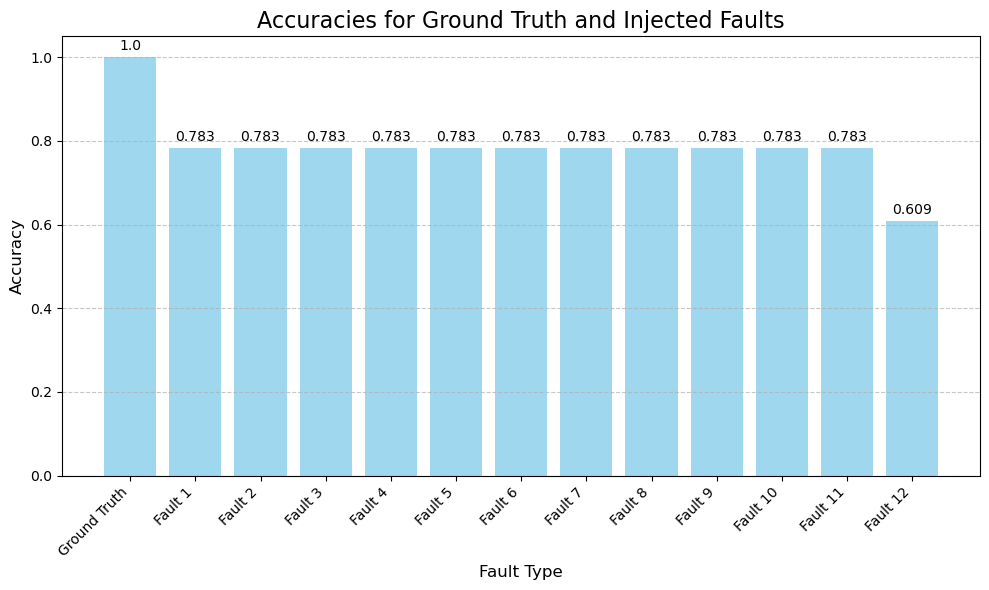

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Accuracies for 12 injected faults (example values)
fault_accuracies =np.array(results_val_acc)  # Replace with your actual accuracy data

# Add ground truth accuracy as the first element (which is 1)
accuracies = np.insert(fault_accuracies, 0, 1.0)

# Labels for the x-axis
labels = ['Ground Truth'] + [f'Fault {i+1}' for i in range(12)]

# Create a bar plot
plt.figure(figsize=(10, 6))
bars = plt.bar(labels, accuracies, color='skyblue', alpha=0.8)

# Add title and axis labels
plt.title('Accuracies for Ground Truth and Injected Faults', fontsize=16)
plt.xlabel('Fault Type', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

# Add a grid for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Annotate the bars with the accuracy values
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 3), ha='center', va='bottom')

# Rotate the x labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


In [12]:
datainfo, results

({'dataname': 'acuteinflammation',
  'N_feature': 6,
  'N_class': 2,
  'N_train': 70,
  'N_valid': 23,
  'N_test': 25},
 [0.6086956521739131,
  0.6086956521739131,
  1.0,
  0.391304347826087,
  0.391304347826087,
  0.6086956521739131,
  0.391304347826087,
  0.6086956521739131,
  0.391304347826087,
  0.391304347826087,
  0.6086956521739131,
  0.6086956521739131])

In [13]:
predictions[0][1], predictions[1][1]

(tensor([0.3710, 0.3710]), tensor([0.3719, 0.3719]))

In [14]:
predictions[0].shape

torch.Size([118, 2])

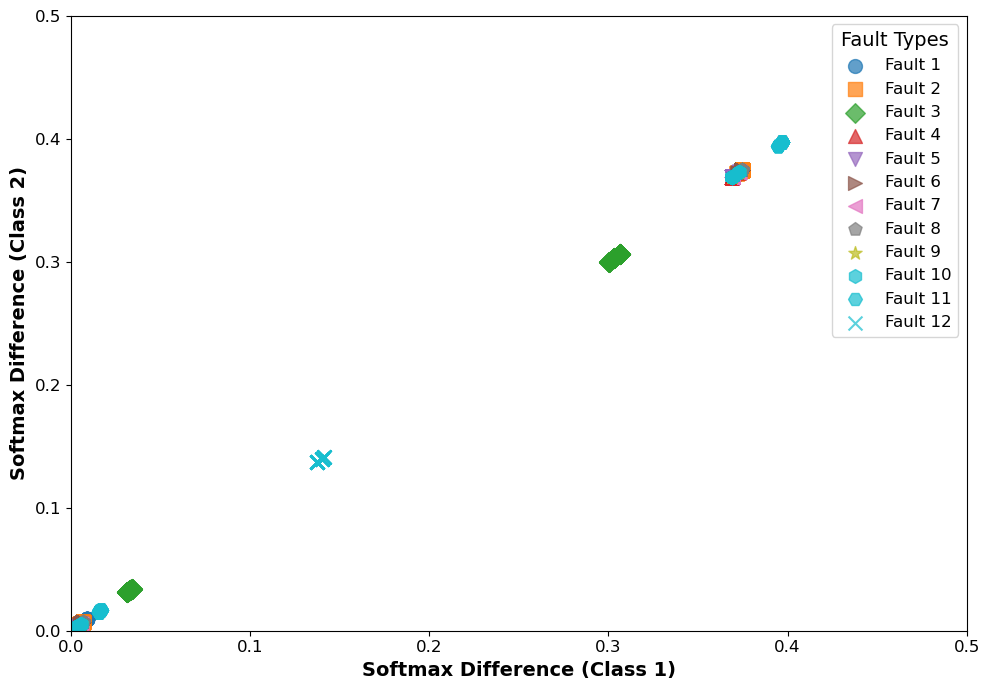

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming you have 12 faults, each with a (dataset_size, 2) array of softmax differences
# Replace with your actual data (12 faults, dataset_size=100, 2 values per point)
fault_data = np.array(predictions)  # Simulating closely packed data
num_faults = len(fault_data)

# Create labels for each fault (0 to 11) to represent different faults
labels = np.array([i for i in range(num_faults) for _ in range(fault_data.shape[1])])

# Add jitter to each fault to spread the points slightly (small random noise)
# jitter = 0.01  # Reduce jitter based on how closely packed the data is
# fault_data_jittered = fault_data + np.random.normal(0, jitter, fault_data.shape)
fault_data_jittered = fault_data

# Generate a colormap with 12 distinct colors using tab20c or Set1
cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(num_faults)]

# Define a list of markers to add more distinction
markers = ['o', 's', 'D', '^', 'v', '>', '<', 'p', '*', 'h', 'H', 'x']

# Create the scatter plot
plt.figure(figsize=(10, 7))
for i in range(num_faults):
    plt.scatter(fault_data_jittered[i][:, 0], fault_data_jittered[i][:, 1], label=f'Fault {i+1}',
                color=colors[i], alpha=0.7, s=100, marker=markers[i])

# Zoom into the area where the points are concentrated (tighten limits based on your data)
plt.xlim(0, 0.5)  # Zoom in further on the x-axis
plt.ylim(0, 0.5)  # Zoom in further on the y-axis

# Add a legend with larger text and bold font
plt.legend(loc="upper right", title="Fault Types", bbox_to_anchor=(1, 1), fontsize=12, title_fontsize=14,)

# Add labels and title
# plt.title('Improved Visualization with Tighter Zoom', fontsize=14)
plt.xlabel('Softmax Difference (Class 1)', fontsize=14, fontweight='bold')
plt.ylabel('Softmax Difference (Class 2)', fontsize=14, fontweight='bold')

# Make the ticks larger and bolder for visibility
plt.xticks(fontsize=12, )
plt.yticks(fontsize=12, )

# Display the plot
plt.tight_layout()
plt.show()


In [8]:
import os
import torch
import pandas as pd

# Initialize variables for saving the data
trained_model = None
for act in acts:
    args.act = act
    for a, p in zip(type_nonlinears, project_name):
        args.type_nonlinear = a
        for fr in fault_ratio:
            pn=act+'_'+str(int(fr*100))+'_'+p
            args.project_name = pn
            # print(pn)
            for fr_test in test_fault_ratio:
                all_results = []
                results = torch.zeros([13, 10, 8])
                for seed in range(10):
                    args.SEED = seed
                    for ds in dataset:
                        args.DATASET = ds
                        valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
                        test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
                        for x, y in valid_loader:
                            X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
                        for x, y in test_loader:
                            X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)

                        topology = [datainfo['N_feature']] + args.hidden + [datainfo['N_class']]
                        pnn = pNN.pNN(topology, args).to(args.DEVICE)
                        pnn.UpdateVariation(1, 0.)
                        # print('check number of devices', pnn.DeviceCount1)

                        modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
                        model_file = f"./archive_results/filter_10092024/{pn}/models/{modelname}"
                        # model_file = f"./{pn}/models/{modelname}"
                        if not os.path.exists(model_file):
                            print(f"Model {model_file} does not exist")
                            continue
                        print(f"Loading model from {model_file}")

                        trained_model = torch.load(model_file, map_location=args.DEVICE)
                        args.fault_ratio = fr_test
                        args.e_fault = int(trained_model.DeviceCount1 * fr_test)
                        args.N_fault = 50
                        if args.e_fault == 0:
                            args.N_fault = 1
                        N_Faults = args.N_fault
                        trained_model.UpdateArgs(args)
                        trained_model.UpdateFault(args.N_fault, args.e_fault)
                        trained_model.UpdateVariation(1, 0.)
                        # print(trained_model.DeviceCount1)
                        # print(fr_test, trained_model.DeviceCount1, args.e_fault)
                        print(f"Fault Ratio: {trained_model.args.fault_ratio} -- Fault Count: {trained_model.e_fault}, --Number of Fault: {trained_model.N_fault}")
                        # print(f"Fault Ratio: {trained_model.args.fault_ratio} -- Fault Count: {trained_model.args.e_fault}, --number of fault: {trained_model.args.N_fault}")

                        evaluator = Evaluator(args).to(args.DEVICE)
                        SetSeed(args.SEED)
                        valid_acc_list, valid_std_list, valid_power_list, valid_area_list = [], [], [], []
                        test_acc_list, test_std_list, test_power_list, test_area_list = [], [], [], []

                        
                        
                        total_time = 0.0
                        
                        for faultsample in range(1):
                            with torch.no_grad():
                                
                                result_valid = evaluator(trained_model, X_valid, y_valid)
                                valid_acc, valid_std, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']
                                start = time.time()
                                result_test = evaluator(trained_model, X_test, y_test)
                                end = time.time()
                                elapsed_time = start - end
                                total_time += elapsed_time
                                test_acc, test_std, test_power, test_area = result_test['acc'], result_test['std'], result_test['power'], result_test['area']

                                valid_acc_list.append(valid_acc)
                                valid_std_list.append(valid_std)
                                valid_power_list.append(valid_power)
                                valid_area_list.append(valid_area)
                                test_acc_list.append(test_acc)
                                test_std_list.append(test_std)
                                test_power_list.append(test_power)
                                test_area_list.append(test_area)
                                
                        average_time = total_time / (N_Faults * len(dataset))
                        print(f"Average Inference Time: {average_time:.2f} ms")

                        results[ds, seed, 0] = torch.mean(torch.tensor(valid_acc_list))
                        results[ds, seed, 1] = torch.mean(torch.tensor(valid_std_list))
                        results[ds, seed, 2] = torch.mean(torch.tensor(valid_power_list)) * 1e6
                        results[ds, seed, 3] = torch.mean(torch.tensor(valid_area_list))
                        results[ds, seed, 4] = torch.mean(torch.tensor(test_acc_list))
                        results[ds, seed, 5] = torch.mean(torch.tensor(test_std_list))
                        results[ds, seed, 6] = torch.mean(torch.tensor(test_power_list)) * 1e6
                        results[ds, seed, 7] = torch.mean(torch.tensor(test_area_list))

                        # Collect results for saving
                        # f"Average Inference Time: {average_time:.2f} ms"
                        temp_result = [normal_datasets[ds], seed, results[ds, seed, 0].item(), results[ds, seed, 1].item(),
                                            results[ds, seed, 2].item(), results[ds, seed, 3].item(),
                                            results[ds, seed, 4].item(), results[ds, seed, 5].item(), results[ds, seed, 6].item(), results[ds, seed, 7].item(), average_time,]
                        for i, count_act in enumerate(trained_model.soft_count_act):
                            temp_result.append(count_act.item())
                        all_results.append(temp_result)
                        print(f'valid_acc: {results[ds, seed, 0]:.2f} -- valid_std: {results[ds, seed, 1]:.2f} -- test_acc: {results[ds, seed, 4]:.2f} -- test_std: {results[ds, seed, 5]:.2f}')
                        print('----------------------------------------------')
                # Convert all results to a pandas DataFrame
                columns = ['Dataset', 'Seed', 
                           'Valid Accuracy', 'Valid STD', 'Valid Power', 'Valid Area', 
                           'Test Accuracy', 'Test STD', 'Test Power', 'Test Area', 
                           'Inference Time']
                for i, act_i in enumerate(trained_model.act):
                    columns.append(act_i.name)
                # Sort in place based on 'ds'
                all_results.sort(key=lambda x: x[0])
                df = pd.DataFrame(all_results, columns=columns)
                # Save the DataFrame to an Excel file
                if not os.path.exists(f"./archive_results/filter_10092024/{pn}/evaluation_{N_Faults}/"):
                    os.makedirs(f"./archive_results/filter_10092024/{pn}/evaluation_{N_Faults}/")
                excel_filename = f"./archive_results/filter_10092024/{pn}/evaluation_{N_Faults}/{fr_test}_results_analysis.xlsx"
                df.to_excel(excel_filename, index=False)
                print(f"Results have been saved to {excel_filename}")

Loading model from ./archive_results/filter_10092024/none_0_FaultAnalysisNormal/models/data_00_acuteinflammation_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Fault Ratio: 0.0 -- Fault Count: 0, --Number of Fault: 1
Average Inference Time: -0.01 ms
valid_acc: 0.39 -- valid_std: 0.00 -- test_acc: 0.68 -- test_std: 0.00
----------------------------------------------
Loading model from ./archive_results/filter_10092024/none_0_FaultAnalysisNormal/models/data_02_breastcancerwisc_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Fault Ratio: 0.0 -- Fault Count: 0, --Number of Fault: 1
Average Inference Time: -0.01 ms
valid_acc: 0.66 -- valid_std: 0.00 -- test_acc: 0.71 -- test_std: 0.00
----------------------------------------------
Loading model from ./archive_results/filter_10092024/none_0_FaultAnalysisNormal/models/data_04_energyy1_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Fault Ratio: 0.0 -- Fault Count: 0, --Number of Fault: 1
Average Inference Time: -0.01 ms
val

In [41]:
import os
import torch
import pandas as pd

# Initialize variables for saving the data
trained_model = None
for act in acts:
    args.act = act
    for a, p in zip(type_nonlinears, project_name):
        args.type_nonlinear = a
        for fr in fault_ratio:
            pn=act+'_'+str(int(fr*100))+'_'+p
            args.project_name = pn
            print(pn)
            for fr_test in [0.0, 0.025, 0.05, 0.075, 0.1]:
                all_results = []
                results = torch.zeros([13, 10, 6])
                for seed in range(10):
                    args.SEED = seed
                    for ds in dataset:
                        args.DATASET = ds
                        valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
                        test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
                        for x, y in valid_loader:
                            X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
                        for x, y in test_loader:
                            X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)

                        topology = [datainfo['N_feature']] + args.hidden + [datainfo['N_class']]
                        pnn = pNN.pNN(topology, args).to(args.DEVICE)
                        pnn.UpdateVariation(1, 0.)

                        modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
                        model_file = f"./archive_results/06092024/{pn}/models/{modelname}"
                        if not os.path.exists(model_file):
                            print(f"Model {model_file} does not exist")
                            continue
                        print(f"Loading model from {model_file}")

                        trained_model = torch.load(model_file, map_location=args.DEVICE)
                        args.fault_ratio = fr_test
                        args.e_fault = int(trained_model.DeviceCount1 * fr_test)
                        trained_model.UpdateArgs(args)
                        trained_model.UpdateFault(1, args.e_fault)
                        trained_model.UpdateVariation(1, 0.)

                        evaluator = Evaluator(args).to(args.DEVICE)
                        SetSeed(args.SEED)
                        valid_acc_list, valid_power_list, valid_area_list = [], [], []
                        test_acc_list, test_power_list, test_area_list = [], [], []

                        N_Faults = 1
                        
                        total_time = 0.0
                        
                        for faultsample in range(N_Faults):
                            with torch.no_grad():
                                
                                result_valid = evaluator(trained_model, X_valid, y_valid)
                                valid_acc, valid_power, valid_area = result_valid['acc'], result_valid['power'], result_valid['area']
                                start = time.time()
                                result_test = evaluator(trained_model, X_test, y_test)
                                end = time.time()
                                elapsed_time = start - end
                                total_time += elapsed_time
                                test_acc, test_power, test_area = result_test['acc'], result_test['power'], result_test['area']

                                valid_acc_list.append(valid_acc)
                                valid_power_list.append(valid_power)
                                valid_area_list.append(valid_area)
                                test_acc_list.append(test_acc)
                                test_power_list.append(test_power)
                                test_area_list.append(test_area)
                                
                        average_time = total_time / (N_Faults * len(dataset) * 10)
                        print(f"Average Inference Time: {average_time:.2f} ms")

                        results[ds, seed, 0] = torch.mean(torch.tensor(valid_acc_list))
                        results[ds, seed, 1] = torch.mean(torch.tensor(valid_power_list)) * 1e6
                        results[ds, seed, 2] = torch.mean(torch.tensor(valid_area_list))
                        results[ds, seed, 3] = torch.mean(torch.tensor(test_acc_list))
                        results[ds, seed, 4] = torch.mean(torch.tensor(test_power_list)) * 1e6
                        results[ds, seed, 5] = torch.mean(torch.tensor(test_area_list))

                        # Collect results for saving
                        # f"Average Inference Time: {average_time:.2f} ms"
                        temp_result = [normal_datasets[ds], seed, results[ds, seed, 0].item(), results[ds, seed, 1].item(),
                                            results[ds, seed, 2].item(), results[ds, seed, 3].item(),
                                            results[ds, seed, 4].item(), results[ds, seed, 5].item(), average_time,]
                        for i, count_act in enumerate(trained_model.soft_count_act):
                            temp_result.append(count_act.item())
                        all_results.append(temp_result)
                        print(f'valid_acc: {results[ds, seed, 0]:.2f} -- valid_power: {results[ds, seed, 1]:.2f} -- valid_area: {results[ds, seed, 2]:.2f} -- test_acc: {results[ds, seed, 3]:.2f} -- test_power: {results[ds, seed, 4]:.2f} -- test_area: {results[ds, seed, 5]:.2f}')
                        print('----------------------------------------------')
                # Convert all results to a pandas DataFrame
                columns = ['Dataset', 'Seed', 'Valid Accuracy', 'Valid Power', 'Valid Area', 'Test Accuracy', 'Test Power', 'Test Area', 'Inference Time']
                for i, act_i in enumerate(trained_model.act):
                    columns.append(act_i.name)
                # Sort in place based on 'ds'
                all_results.sort(key=lambda x: x[0])
                df = pd.DataFrame(all_results, columns=columns)
                # Save the DataFrame to an Excel file
                if not os.path.exists(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/"):
                    os.makedirs(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/")
                excel_filename = f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/{fr_test}_results_analysis.xlsx"
                df.to_excel(excel_filename, index=False)
                print(f"Results have been saved to {excel_filename}")

none_0_FaultAnalysisMixed
Model ./archive_results/06092024/none_0_FaultAnalysisMixed/models/data_00_acuteinflammation_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model does not exist
Loading model from ./archive_results/06092024/none_0_FaultAnalysisMixed/models/data_01_balancescale_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.45 -- valid_power: 25.82 -- valid_area: 30.21 -- test_acc: 0.43 -- test_power: 25.86 -- test_area: 62.72
----------------------------------------------
Loading model from ./archive_results/06092024/none_0_FaultAnalysisMixed/models/data_02_breastcancerwisc_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.66 -- valid_power: 23.19 -- valid_area: 78.81 -- test_acc: 0.71 -- test_power: 23.08 -- test_area: 81.86
----------------------------------------------
Loading model from ./archive_results/06092024/none_0_FaultAnalysisMixed/models/data_03_cardiotocography3c

In [36]:
import os
import torch
import pandas as pd

# Initialize variables for saving the data
trained_model = None
for act in acts:
    args.act = act
    for a, p in zip(type_nonlinears, project_name):
        args.type_nonlinear = a
        for fr in fault_ratio:
            pn=act+'_'+str(int(fr*100))+'_'+p
            args.project_name = pn
            print(pn)
            for fr_test in [0.0, 0.025, 0.05, 0.075, 0.1]:
                all_results = []
                results = torch.zeros([13, 10, 6])
                for seed in range(10):
                    args.SEED = seed
                    for ds in dataset:
                        args.DATASET = ds
                        valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
                        test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
                        for x, y in valid_loader:
                            X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
                        for x, y in test_loader:
                            X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)

                        topology = [datainfo['N_feature']] + args.hidden + [datainfo['N_class']]
                        pnn = pNN.pNN(topology, args).to(args.DEVICE)
                        pnn.UpdateVariation(1, 0.)

                        modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
                        model_file = f"./archive_results/06092024/{pn}/models/{modelname}"
                        if not os.path.exists(model_file):
                            print(f"Model {model_file} does not exist")
                            continue
                        print(f"Loading model from {model_file}")

                        trained_model = torch.load(model_file, map_location=args.DEVICE)
                        args.fault_ratio = fr_test
                        args.e_fault = int(trained_model.DeviceCount1 * fr_test)
                        trained_model.UpdateArgs(args)
                        trained_model.UpdateFault(1, args.e_fault)
                        trained_model.UpdateVariation(1, 0.)

                        evaluator = Evaluator(args).to(args.DEVICE)
                        SetSeed(args.SEED)
                        valid_acc_list, valid_power_list, valid_area_list = [], [], []
                        test_acc_list, test_power_list, test_area_list = [], [], []

                        N_Faults = 1
                        
                        total_time = 0.0
                        
                        for faultsample in range(N_Faults):
                            with torch.no_grad():
                                
                                result_valid = evaluator(trained_model, X_valid, y_valid)
                                valid_acc, valid_power, valid_area = result_valid['acc'], result_valid['power'], result_valid['area']
                                start = time.time()
                                result_test = evaluator(trained_model, X_test, y_test)
                                end = time.time()
                                elapsed_time = start - end
                                total_time += elapsed_time
                                test_acc, test_power, test_area = result_test['acc'], result_test['power'], result_test['area']

                                valid_acc_list.append(valid_acc)
                                valid_power_list.append(valid_power)
                                valid_area_list.append(valid_area)
                                test_acc_list.append(test_acc)
                                test_power_list.append(test_power)
                                test_area_list.append(test_area)
                                
                        average_time = total_time / (N_Faults * len(dataset) * 10)
                        print(f"Average Inference Time: {average_time:.2f} ms")

                        results[ds, seed, 0] = torch.mean(torch.tensor(valid_acc_list))
                        results[ds, seed, 1] = torch.mean(torch.tensor(valid_power_list)) * 1e6
                        results[ds, seed, 2] = torch.mean(torch.tensor(valid_area_list))
                        results[ds, seed, 3] = torch.mean(torch.tensor(test_acc_list))
                        results[ds, seed, 4] = torch.mean(torch.tensor(test_power_list)) * 1e6
                        results[ds, seed, 5] = torch.mean(torch.tensor(test_area_list))

                        # Collect results for saving
                        # f"Average Inference Time: {average_time:.2f} ms"
                        temp_result = [normal_datasets[ds], seed, results[ds, seed, 0].item(), results[ds, seed, 1].item(),
                                            results[ds, seed, 2].item(), results[ds, seed, 3].item(),
                                            results[ds, seed, 4].item(), results[ds, seed, 5].item(), average_time,]
                        for i, count_act in enumerate(trained_model.soft_count_act):
                            temp_result.append(count_act.item())
                        all_results.append(temp_result)
                        print(f'valid_acc: {results[ds, seed, 0]:.2f} -- valid_power: {results[ds, seed, 1]:.2f} -- valid_area: {results[ds, seed, 2]:.2f} -- test_acc: {results[ds, seed, 3]:.2f} -- test_power: {results[ds, seed, 4]:.2f} -- test_area: {results[ds, seed, 5]:.2f}')
                        print('----------------------------------------------')
                # Convert all results to a pandas DataFrame
                columns = ['Dataset', 'Seed', 'Valid Accuracy', 'Valid Power', 'Valid Area', 'Test Accuracy', 'Test Power', 'Test Area', 'Inference Time']
                for i, act_i in enumerate(trained_model.act):
                    columns.append(act_i.name)
                # Sort in place based on 'ds'
                all_results.sort(key=lambda x: x[0])
                df = pd.DataFrame(all_results, columns=columns)
                # Save the DataFrame to an Excel file
                if not os.path.exists(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/"):
                    os.makedirs(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/")
                excel_filename = f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/{fr_test}_results_analysis.xlsx"
                df.to_excel(excel_filename, index=False)
                print(f"Results have been saved to {excel_filename}")

tanh_0_FaultAnalysisNormal
Loading model from ./archive_results/06092024/tanh_0_FaultAnalysisNormal/models/data_00_acuteinflammation_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 1.00 -- valid_power: 32.73 -- valid_area: 103.15 -- test_acc: 1.00 -- test_power: 33.34 -- test_area: 103.15
----------------------------------------------
Loading model from ./archive_results/06092024/tanh_0_FaultAnalysisNormal/models/data_01_balancescale_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.73 -- valid_power: 12.54 -- valid_area: 91.56 -- test_acc: 0.73 -- test_power: 12.74 -- test_area: 91.56
----------------------------------------------
Loading model from ./archive_results/06092024/tanh_0_FaultAnalysisNormal/models/data_02_breastcancerwisc_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.96 -- valid_power: 8.35 -- valid_area: 63.65 -- test_ac

In [39]:
import os
import torch
import pandas as pd

# Initialize variables for saving the data
trained_model = None
for act in acts:
    args.act = act
    for a, p in zip(type_nonlinears, project_name):
        args.type_nonlinear = a
        for fr in fault_ratio:
            pn=act+'_'+str(int(fr*100))+'_'+p
            args.project_name = pn
            print(pn)
            for fr_test in [0.0, 0.025, 0.05, 0.075, 0.1]:
                all_results = []
                results = torch.zeros([13, 10, 6])
                for seed in range(10):
                    args.SEED = seed
                    for ds in dataset:
                        args.DATASET = ds
                        valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
                        test_loader, datainfo = GetDataLoader(args, 'test', path='./dataset/')
                        for x, y in valid_loader:
                            X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
                        for x, y in test_loader:
                            X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)

                        topology = [datainfo['N_feature']] + args.hidden + [datainfo['N_class']]
                        pnn = pNN.pNN(topology, args).to(args.DEVICE)
                        pnn.UpdateVariation(1, 0.)

                        modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model"
                        model_file = f"./archive_results/06092024/{pn}/models/{modelname}"
                        if not os.path.exists(model_file):
                            print(f"Model {model_file} does not exist")
                            continue
                        print(f"Loading model from {model_file}")

                        trained_model = torch.load(model_file, map_location=args.DEVICE)
                        args.fault_ratio = fr_test
                        args.e_fault = int(trained_model.DeviceCount1 * fr_test)
                        trained_model.UpdateArgs(args)
                        trained_model.UpdateFault(1, args.e_fault)
                        trained_model.UpdateVariation(1, 0.)

                        evaluator = Evaluator(args).to(args.DEVICE)
                        SetSeed(args.SEED)
                        valid_acc_list, valid_power_list, valid_area_list = [], [], []
                        test_acc_list, test_power_list, test_area_list = [], [], []

                        N_Faults = 1
                        
                        total_time = 0.0
                        
                        for faultsample in range(N_Faults):
                            with torch.no_grad():
                                
                                result_valid = evaluator(trained_model, X_valid, y_valid)
                                valid_acc, valid_power, valid_area = result_valid['acc'], result_valid['power'], result_valid['area']
                                start = time.time()
                                result_test = evaluator(trained_model, X_test, y_test)
                                end = time.time()
                                elapsed_time = start - end
                                total_time += elapsed_time
                                test_acc, test_power, test_area = result_test['acc'], result_test['power'], result_test['area']

                                valid_acc_list.append(valid_acc)
                                valid_power_list.append(valid_power)
                                valid_area_list.append(valid_area)
                                test_acc_list.append(test_acc)
                                test_power_list.append(test_power)
                                test_area_list.append(test_area)
                                
                        average_time = total_time / (N_Faults * len(dataset) * 10)
                        print(f"Average Inference Time: {average_time:.2f} ms")

                        results[ds, seed, 0] = torch.mean(torch.tensor(valid_acc_list))
                        results[ds, seed, 1] = torch.mean(torch.tensor(valid_power_list)) * 1e6
                        results[ds, seed, 2] = torch.mean(torch.tensor(valid_area_list))
                        results[ds, seed, 3] = torch.mean(torch.tensor(test_acc_list))
                        results[ds, seed, 4] = torch.mean(torch.tensor(test_power_list)) * 1e6
                        results[ds, seed, 5] = torch.mean(torch.tensor(test_area_list))

                        # Collect results for saving
                        # f"Average Inference Time: {average_time:.2f} ms"
                        temp_result = [normal_datasets[ds], seed, results[ds, seed, 0].item(), results[ds, seed, 1].item(),
                                            results[ds, seed, 2].item(), results[ds, seed, 3].item(),
                                            results[ds, seed, 4].item(), results[ds, seed, 5].item(), average_time,]
                        for i, count_act in enumerate(trained_model.soft_count_act):
                            temp_result.append(count_act.item())
                        all_results.append(temp_result)
                        print(f'valid_acc: {results[ds, seed, 0]:.2f} -- valid_power: {results[ds, seed, 1]:.2f} -- valid_area: {results[ds, seed, 2]:.2f} -- test_acc: {results[ds, seed, 3]:.2f} -- test_power: {results[ds, seed, 4]:.2f} -- test_area: {results[ds, seed, 5]:.2f}')
                        print('----------------------------------------------')
                # Convert all results to a pandas DataFrame
                columns = ['Dataset', 'Seed', 'Valid Accuracy', 'Valid Power', 'Valid Area', 'Test Accuracy', 'Test Power', 'Test Area', 'Inference Time']
                for i, act_i in enumerate(trained_model.act):
                    columns.append(act_i.name)
                # Sort in place based on 'ds'
                all_results.sort(key=lambda x: x[0])
                df = pd.DataFrame(all_results, columns=columns)
                # Save the DataFrame to an Excel file
                if not os.path.exists(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/"):
                    os.makedirs(f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/")
                excel_filename = f"./archive_results/06092024/{pn}/evaluation_{N_Faults}/{fr_test}_results_analysis.xlsx"
                df.to_excel(excel_filename, index=False)
                print(f"Results have been saved to {excel_filename}")

none_0_FaultAnalysisNormal
Loading model from ./archive_results/06092024/none_0_FaultAnalysisNormal/models/data_00_acuteinflammation_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.61 -- valid_power: 63.03 -- valid_area: 116.88 -- test_acc: 0.32 -- test_power: 62.54 -- test_area: 86.79
----------------------------------------------
Loading model from ./archive_results/06092024/none_0_FaultAnalysisNormal/models/data_01_balancescale_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.45 -- valid_power: 35.34 -- valid_area: 101.82 -- test_acc: 0.43 -- test_power: 35.43 -- test_area: 80.96
----------------------------------------------
Loading model from ./archive_results/06092024/none_0_FaultAnalysisNormal/models/data_02_breastcancerwisc_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
Average Inference Time: -0.00 ms
valid_acc: 0.66 -- valid_power: 6.03 -- valid_area: 115.14 -- test_a

In [13]:
# for a, p in zip(type_nonlinears, project_name):    
#     args.type_nonlinear = a
#     for fr in fault_ratio:
#         pn=str(int(fr*100))+'_'+p
#         args.project_name = pn
#         # it should be inner loop for fault ratio
#         for fr_test in [0.0, 0.025, 0.05, 0.075, 0.1]:
#             # ---------------------
#             results = torch.zeros([13,10,6])
#             for seed in range(10):
#                 args.SEED = seed
#                 for ds in dataset:
#                     args.DATASET = ds
#                     valid_loader, datainfo = GetDataLoader(args, 'valid', path='./dataset/')
#                     test_loader , datainfo = GetDataLoader(args, 'test',  path='./dataset/')
#                     for x,y in valid_loader:
#                         X_valid, y_valid = x.to(args.DEVICE), y.to(args.DEVICE)
#                     for x,y in test_loader:
#                         X_test, y_test = x.to(args.DEVICE), y.to(args.DEVICE)
#                     # pprint.pprint(datainfo)
#                     topology = [datainfo['N_feature']] + args.hidden + [datainfo['N_class']]
#                     pnn = pNN.pNN(topology, args).to(args.DEVICE)
#                     pnn.UpdateVariation(1, 0.)
#                     modelname = f'data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{fr}.model'
#                     model_file = f'./{pn}/models/{modelname}'
#                     if not os.path.exists(model_file):
#                         continue
#                     # print(f'{model_file} exist')
#                     trained_model = torch.load(f'./{pn}/models/{modelname}', map_location=args.DEVICE)
#                     args.fault_ratio = fr_test
#                     args.e_fault = int(trained_model.DeviceCount1 * fr_test)
#                     # pnn.load_state_dict(trained_model.state_dict())
#                     trained_model.UpdateArgs(args)
#                     trained_model.UpdateFault(1, args.e_fault)
#                     trained_model.UpdateVariation(1, 0.)
#                     # if not os.path.exists(f"./evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_eTrain_{args.e_train}_eTest{args.e_test}_fTrain_{args.e_fault}_fTest{args.e_fault_test}.matrix"):
#                     # N_Faults = 10
#                     # results = np.zeros([6])
#                     evaluator = Evaluator(args).to(args.DEVICE)
#                     # print(modelname)
#                     SetSeed(args.SEED)
#                     valid_acc_list = []
#                     valid_power_list = []
#                     valid_area_list = []
#                     test_acc_list = []
#                     test_power_list = []
#                     test_area_list = []       
#                     N_Faults = 1
#                     for faultsample in range(N_Faults):
#                         # print(faultsample)
#                         with torch.no_grad():
#                             result_valid = evaluator(trained_model, X_valid, y_valid)
#                             valid_acc, _, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']
#                             result_test  = evaluator(trained_model, X_test,  y_test)
#                             test_acc, _, test_power, test_area = result_test['acc'], result_test['std'], result_test['power'], result_test['area']
#                             valid_acc_list.append(valid_acc)
#                             valid_power_list.append(valid_power)
#                             valid_area_list.append(valid_area)
#                             test_acc_list.append(test_acc)
#                             test_power_list.append(test_power)
#                             test_area_list.append(test_area)     
#                     results[ds,seed,0] = torch.mean(torch.tensor(valid_acc_list))
#                     results[ds,seed,1] = torch.mean(torch.tensor(valid_power_list)) * 1e6
#                     results[ds,seed,2] = torch.mean(torch.tensor(valid_area_list))
#                     results[ds,seed,3] = torch.mean(torch.tensor(test_acc_list))
#                     results[ds,seed,4] = torch.mean(torch.tensor(test_power_list)) * 1e6
#                     results[ds,seed,5] = torch.mean(torch.tensor(test_area_list))  
#                     # torch.save(results, f"./{pn}/evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_eTrain_{args.e_train}_eTest{args.e_test}_fTrain_{args.e_fault}_fTest{args.e_fault_test}.matrix")
#                     # for result in results:
#                     # print(f'./{pn}/models/{modelname}')
#                     print(f'valid_acc: {results[ds,seed,0]:.2f} -- valid_power: {results[ds,seed,1]:.2f} -- valid_area: {results[ds,seed,2]:.2f} -- test_acc: {results[ds,seed,3]:.2f} -- test_power: {results[ds,seed,4]:.2f} -- test_area: {results[ds,seed,5]:.2f}')
#                     print('----------------------------------------------')
#                     # trained_model.UpdateDropout(0.)
#                     # for i, j in zip(trained_model.model, pnn.model):
#                     #     j.theta_.data = i.theta_.data
#             # print(fr, fr_test)
#             # print(results)                        
#             N_selected_seeds = 3
#             re_temp = torch.nan_to_num(results, nan=-10000.)
#             values, top_indices = torch.topk(re_temp[:,:,3], k=N_selected_seeds, dim=1)
            
#             # Initialize lists to store mean and variance results for each dimension
#             mean_var_results = []

#             # Loop over all dimensions except the target dimension
#             for dim in range(re_temp.shape[2]):
                
#                 # Gather the values for the top indices from the current dimension
#                 selected_values = torch.gather(re_temp[:,:,dim], 1, top_indices)
                
#                 # Compute mean and variance of the selected values
#                 mean_selected = torch.mean(selected_values, dim=1)
#                 var_selected = torch.std(selected_values, dim=1)
                
#                 # Combine mean and variance results for the current dimension
#                 selected_results = torch.cat([mean_selected.unsqueeze(-1), var_selected.unsqueeze(-1)], dim=1)
                
#                 # Append the result to the list
#                 mean_var_results.append(selected_results)

#             # Convert the list to a tensor
#             # mean_var_results = torch.stack(mean_var_results, dim=2)  # Stack along a new dimension
#             mean_var_results = np.concatenate(mean_var_results, axis=1) 
            
#             # mean_selected = torch.mean(torch.asarray(values), dim=1)
#             # var_selected = torch.std(torch.asarray(values), dim=1)
#             # selected_results = torch.cat([mean_selected.unsqueeze(-1), var_selected.unsqueeze(-1)], dim=1)
            
#             if not os.path.exists(f"./{pn}/evaluation/"):
#                 os.makedirs(f"./{pn}/evaluation/")
#             np.savetxt(f"./{pn}/evaluation/{fr_test}_test_top_{N_selected_seeds}_var_LPF_acc.txt", mean_var_results, delimiter="\t", fmt='%.5f')

valid_acc: 0.74 -- valid_power: 614.16 -- valid_area: 140.25 -- test_acc: 0.68 -- test_power: 614.57 -- test_area: 140.25
----------------------------------------------
valid_acc: 0.74 -- valid_power: 1529.42 -- valid_area: 261.40 -- test_acc: 0.75 -- test_power: 1525.39 -- test_area: 261.40
----------------------------------------------
valid_acc: 0.79 -- valid_power: 727.69 -- valid_area: 162.12 -- test_acc: 0.85 -- test_power: 727.05 -- test_area: 162.12
----------------------------------------------
valid_acc: 0.70 -- valid_power: 900.27 -- valid_area: 153.80 -- test_acc: 0.27 -- test_power: 902.83 -- test_area: 153.80
----------------------------------------------
valid_acc: 0.24 -- valid_power: 278.12 -- valid_area: 122.78 -- test_acc: 0.52 -- test_power: 278.48 -- test_area: 122.78
----------------------------------------------
valid_acc: 0.83 -- valid_power: 363.79 -- valid_area: 107.12 -- test_acc: 0.85 -- test_power: 362.69 -- test_area: 107.12
-------------------------------

In [7]:
N_selected_seeds = 3
re_temp = torch.nan_to_num(results, nan=-10000.)
values, indices = torch.topk(re_temp[:,:,1], k=N_selected_seeds, dim=1)
mean_selected = torch.mean(torch.asarray(values), dim=1)
var_selected = torch.std(torch.asarray(values), dim=1)
selected_results = torch.cat([mean_selected.unsqueeze(-1), var_selected.unsqueeze(-1)], dim=1)
if not os.path.exists(f"./{p}/evaluation/"):
    os.makedirs(f"./{p}/evaluation/")
np.savetxt(f"./{p}/evaluation/non_var_test_top_{N_selected_seeds}_var_LPF_acc.txt", selected_results.numpy(), delimiter="\t", fmt='%.5f')

0.00037738573155365884

In [67]:
pred = pnn(X_valid)[0,0,:,:]
(torch.argmax(pred, dim=1) == y_valid).sum() / y_valid.numel()

tensor(0.6957)

In [49]:
pnn.UpdateFault(1, 2)

In [59]:
pred = pnn(X_valid)[0,0,:,:]
(torch.argmax(pred, dim=1) == y_valid).sum() / y_valid.numel()

tensor(0.6087)

In [16]:


if not os.path.exists(f"./evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}.matrix"):

    N_Faults = 500
    results = torch.zeros([N_Faults, 6])
    evaluator = Evaluator(args).to(args.DEVICE)
    modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_faults_{args.e_fault:1d}.model"

    if os.path.exists(f'./models/{modelname}'):
        model = torch.load(f'./models/{modelname}', map_location=args.DEVICE)
        print(modelname)
        model.UpdateArgs(args)
        
        model.UpdateVariation(args.N_test, args.e_test)
        model.UpdateFault(1, args.e_fault_test)
    
        SetSeed(args.SEED)

        for faultsample in range(N_Faults):
            print(faultsample)
        
            with torch.no_grad():
                result_valid = evaluator(model, X_valid, y_valid)
                valid_acc, _, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']
                result_test  = evaluator(model, X_test,  y_test)
                test_acc, _, test_power, test_area = result_test['acc'], result_test['std'], result_test['power'], result_test['area']
        
            results[faultsample, 0] = valid_acc
            results[faultsample, 1] = valid_power
            results[faultsample, 2] = valid_area
            results[faultsample, 3] = test_acc
            results[faultsample, 4] = test_power
            results[faultsample, 5] = test_area
                
                            
        torch.save(results, f"./evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_eTrain_{args.e_train}_eTest{args.e_test}_fTrain_{args.e_fault}_fTest{args.e_fault_test}.matrix")

In [69]:
if not os.path.exists(f"./evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{args.fault_ratio}.matrix"):

    # N_Faults = 500
    N_Faults = 50
    results = torch.zeros([N_Faults, 6])
    evaluator = Evaluator(args).to(args.DEVICE)
    modelname = f"data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_epsilon_{args.e_train}_dropout_{args.dropout}_fault_ratio_{args.fault_ratio}.model"

    if os.path.exists(f'./0_normal_FaultAnalysisCR/models/{modelname}'):
        model = torch.load(f'./0_normal_FaultAnalysisCR/models/{modelname}', map_location=args.DEVICE)
        print(modelname)
        model.UpdateArgs(args)
        
        model.UpdateVariation(args.N_test, args.e_test)
        model.UpdateFault(1, args.e_fault_test)
    
        SetSeed(args.SEED)

        for faultsample in range(N_Faults):
            print(faultsample)
        
            with torch.no_grad():
                result_valid = evaluator(model, X_valid, y_valid)
                valid_acc, _, valid_power, valid_area = result_valid['acc'], result_valid['std'], result_valid['power'], result_valid['area']
                result_test  = evaluator(model, X_test,  y_test)
                test_acc, _, test_power, test_area = result_test['acc'], result_test['std'], result_test['power'], result_test['area']
        
            results[faultsample, 0] = valid_acc
            results[faultsample, 1] = valid_power
            results[faultsample, 2] = valid_area
            results[faultsample, 3] = test_acc
            results[faultsample, 4] = test_power
            results[faultsample, 5] = test_area
            
            for result in results:
                print()
                print(f'valid_acc: {result[0]:.2f} -- valid_power: {result[1]:.2f} -- valid_area: {result[2]:.2f} -- test_acc: {result[3]:.2f} -- valid_power: {result[4]:.2f} -- valid_area: {result[5]:.2f}')

                
                            
        torch.save(results, f"./evaluation/result_data_{args.DATASET:02d}_{datainfo['dataname']}_seed_{args.SEED:02d}_eTrain_{args.e_train}_eTest{args.e_test}_fTrain_{args.e_fault}_fTest{args.e_fault_test}_dropout_{args.dropout}_fault_ratio_{args.fault_ratio}.matrix")

data_00_acuteinflammation_seed_00_epsilon_0.0_dropout_0.0_fault_ratio_0.0.model
0
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0002])
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0001])
1
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0002])
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0001])
2
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0002])
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0001])
3
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0002])
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0001])
4
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06]) tensor([0.0002])
---------- check power ---------- tensor([5.1250e-05]) tensor([7.2600e-06

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Data for Table 1: Accuracy of Normal Circuits
data1 = {
    "Dataset": [0, 2, 3, 5, 10, 11, 12, "Average"],
    "Normal Circuits Accuracy (0%)": [0.920000017, 0.708860755, 0.746835472, 0.582278491, 0.518987356, 0.670886099, 0.634920657, 0.6573699154],
    "Normal Circuits Accuracy (5%)": [0.680000072, 0.708860755, 0.746835472, 0.658227869, 0.797468342, 0.670886099, 0.634920657, 0.6716374114],
    "Normal Circuits Accuracy (10%)": [0.680000072, 0.708860755, 0.746835472, 0.772151887, 0.721518993, 0.670886099, 0.634920657, 0.7022141963]
}
df1 = pd.DataFrame(data1)

# Data for Table 2: Accuracy of Robust Circuits
data2 = {
    "Dataset": [0, 2, 3, 5, 10, 11, 12, "Average"],
    "Robust Circuits Accuracy (0%)": [0.920000017, 0.708860755, 0.746835472, 0.6970554, 0.518987356, 0.670886099, 0.634920657, 0.698324147],
    "Robust Circuits Accuracy (5%)": [0.680000072, 0.898731435, 0.848101258, 0.848101258, 0.721518993, 0.870886099, 0.634920657, 0.7096438894],
    "Robust Circuits Accuracy (10%)": [0.959999875, 0.708860755, 0.759493649, 0.759493649, 0.797468342, 0.870886099, 0.634920657, 0.8083319313],
    "Power (uW)": [538.9016113, 610.9122314, 1747.703857, 520.0432129, 1015.98645, 181.2739105, 427.5706177, 1289.000113]
}
df2 = pd.DataFrame(data2)

# Data for Table 3: Activation Function Selection
data3 = {
    "Activation Function": ["TanhRT", "pReLURT", "SigmoidRT", "ClippedReLU"],
    "% Selected (Normal Circuits)": [29.23742936, 28.33999313, 19.47885468, 22.94372283],
    "% Selected (Robust Circuits)": [26.69312151, 17.61940766, 21.49407958, 34.19312431]
}
df3 = pd.DataFrame(data3)

# Function to create images from DataFrames
def save_table_image(df, filename, title):
    fig, ax = plt.subplots(figsize=(8, 4))  # Adjusted size for clarity
    ax.axis('tight')
    ax.axis('off')
    table = ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.auto_set_column_width([0, 1, 2, 3])
    table.set_fontsize(10)
    table.scale(1.2, 1.2)  # Adjusted scaling for better readability
    plt.title(title)
    plt.savefig(filename, bbox_inches='tight')
    plt.close()

# Save the tables as images
save_table_image(df1, './mnt/data/Table1_NormalCircuits.png', 'Accuracy of Normal Circuits')
save_table_image(df2, './mnt/data/Table2_RobustCircuits.png', 'Accuracy of Robust Circuits')
save_table_image(df3, './mnt/data/Table3_ActivationFunctionSelection.png', 'Activation Function Selection')

('/mnt/data/Table1_NormalCircuits.png', '/mnt/data/Table2_RobustCircuits.png', '/mnt/data/Table3_ActivationFunctionSelection.png')


('/mnt/data/Table1_NormalCircuits.png',
 '/mnt/data/Table2_RobustCircuits.png',
 '/mnt/data/Table3_ActivationFunctionSelection.png')

In [42]:
import os
import shutil

source_folder = './archive_results/06092024/'
destination_folder = './archive_results/06092024_evaluation/'
if not os.path.isdir(destination_folder):
    os.mkdir(destination_folder)
# Get a list of all folders in the source folder
folders = [folder for folder in os.listdir(source_folder) if os.path.isdir(os.path.join(source_folder, folder))]
print(len(folders))

# Iterate over the folders
for folder in folders:
    evaluation_folder = os.path.join(source_folder, folder, 'evaluation_1')
    if os.path.exists(evaluation_folder):
        destination_path = os.path.join(destination_folder, folder, 'evaluation_1')
        shutil.copytree(evaluation_folder, destination_path)

55
